In [1]:
import gym
import math
import torch
import lime
import lime.lime_tabular
import numpy as np
import pandas as pd
from sklearn.linear_model import RidgeClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from stable_baselines3 import PPO
from stable_baselines3.common.vec_env.dummy_vec_env import DummyVecEnv

F:\anaconda3\envs\ds-project\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
env_name = "LunarLander-v2"
env = gym.make(env_name)
env = DummyVecEnv([lambda : env])
np.random.seed(0)
df = pd.read_csv('LunarLanderData.csv')
train = df.drop(columns='ACT', axis=1).values
df.head()

,CX,CY,LVX,LVY,ANG,AV,LG,RG,ACT
0,-0.004885,1.408664,-0.494846,-0.100275,0.005668,0.112090,0.0,0.0,3
1,-0.009706,1.405829,-0.486045,-0.126013,0.009576,0.078170,0.0,0.0,3
2,-0.014443,1.402384,-0.475432,-0.153145,0.011352,0.035536,0.0,0.0,3
3,-0.019082,1.398329,-0.463324,-0.180216,0.010702,-0.013003,0.0,0.0,3
4,-0.023632,1.393668,-0.451967,-0.207104,0.007777,-0.058506,0.0,0.0,3


In [3]:
model = PPO(
    "MlpPolicy", 
    env=env, 
    n_steps=1024, 
    batch_size=64, 
    gae_lambda=0.98, 
    gamma=0.999, 
    n_epochs=4, 
    ent_coef=0.01, 
    verbose=1
)

Using cpu device


In [4]:
env = gym.make(env_name)
model = PPO.load("./model/LunarLander.pkl")

state = env.reset()
done = False 
score = 0

In [5]:
# while not done:
#     action, _ = model.predict(observation=state)
#     state, reward, done, info = env.step(action=action)
#     score += reward
#     env.render()
# env.close()
# score

In [6]:
feature_names = [
    'coordinates of the lander in x', 
    'coordinates of the lander in y', 
    'linear velocities in x', 
    'linear velocities in y', 
    'angle', 
    'angular velocity', 
    'left leg contact with the ground', 
    'right leg contact with the ground'
]
target_names = np.array([
    'do nothing', 
    'fire left',  # fire left orientation engine
    'fire main',  # fire main engine
    'fire right'  # fire right orientation engine
])
explainer = lime.lime_tabular.LimeTabularExplainer(train, 
                                                   feature_names=feature_names, 
                                                   class_names=target_names)

In [7]:
def get_proba(data):
    global generated_data
    generated_data = data
    data = torch.Tensor(data.tolist())
    p = model.policy
    p0 = p.evaluate_actions(data, torch.Tensor([[0]]))[1][0].detach().tolist()
    p1 = p.evaluate_actions(data, torch.Tensor([[1]]))[1][0].detach().tolist()
    p2 = p.evaluate_actions(data, torch.Tensor([[2]]))[1][0].detach().tolist()
    p3 = p.evaluate_actions(data, torch.Tensor([[3]]))[1][0].detach().tolist()
    r = []
    for i in range(len(p0)):
        r.append([
            math.exp(p0[i]), 
            math.exp(p1[i]), 
            math.exp(p2[i]), 
            math.exp(p3[i])
        ])
    return np.array(r)

In [8]:
def get_ridge_model(generated_data, is_print=True):
    new_data = []
    for i, d in enumerate(generated_data):
        d = torch.Tensor(d.tolist())
        action, _ = model.predict(observation=d)
        d = d.tolist()
        d.append(action)
        new_data.append(d)
    new_data = np.array(new_data)
    D = {
        "CX": new_data[:,0], 
        "CY": new_data[:,1], 
        "LVX": new_data[:,2], 
        "LVY": new_data[:,3], 
        "ANG": new_data[:,4], 
        "AV": new_data[:,5], 
        "LG": new_data[:,6], 
        "RG": new_data[:,7], 
        "ACT": new_data[:,8]
    }
    df = pd.DataFrame(D)
    X = df.drop(['ACT'], axis=1)
    y = df['ACT'].to_numpy()
    y = y.astype(np.int32)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
    ridge = RidgeClassifier(random_state=0)
    ridge.fit(X_train, y_train)
    y_pred = ridge.predict(X_test)
    if is_print:
        print("intercept", ridge.intercept_)
        print("coef", ridge.coef_)
        print("accuracy", accuracy_score(y_pred, y_test))
    return ridge, accuracy_score(y_pred, y_test)

In [9]:
# accs = []
# indexs = np.random.randint(1800, size=300)
# for i in indexs:
#     data = train[i]
#     exp = explainer.explain_instance(data, get_proba)
#     ridge, acc = get_ridge_model(generated_data, is_print=False)
#     accs.append(acc)
# print(np.mean(accs))
# print(np.std(accs))

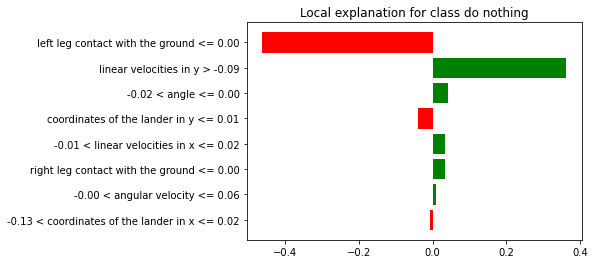

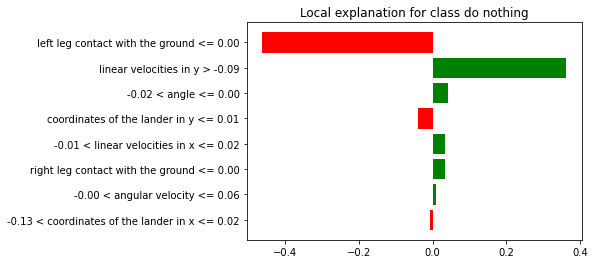

In [10]:
data = np.array([0, 0, 0, 0, 0, 0, 0, 0])
exp = explainer.explain_instance(data, get_proba, labels=(0,))
exp.show_in_notebook(show_table=True)
exp.as_pyplot_figure(label=0)

[-0.00488529  1.4086641  -0.49484643 -0.10027482  0.00566765  0.11209015
  0.          0.        ]


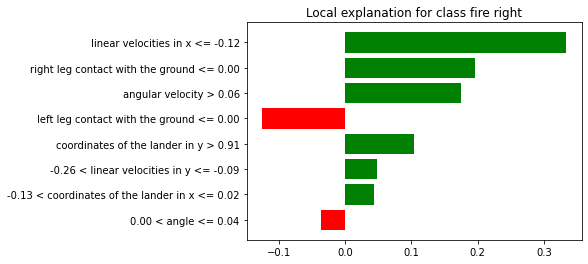

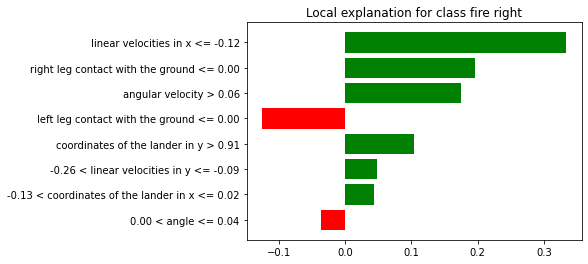

In [11]:
data = train[0]
print(data)
exp = explainer.explain_instance(data, get_proba, labels=(3,))
exp.show_in_notebook(show_table=True)
exp.as_pyplot_figure(label=3)

[-0.00970631  1.4058294  -0.48604545 -0.12601341  0.00957577  0.07816993
  0.          0.        ]


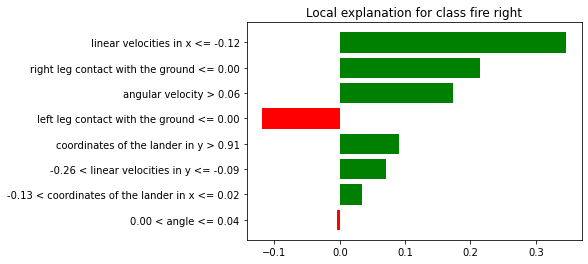

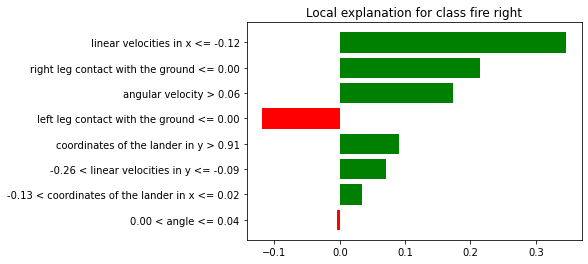

In [12]:
data = train[1]
print(data)
exp = explainer.explain_instance(data, get_proba, labels=(3,))
exp.show_in_notebook(show_table=True)
exp.as_pyplot_figure(label=3)

[-0.05331097  1.3442047  -0.38386765 -0.3948068  -0.06696158 -0.33064058
  0.          0.        ]


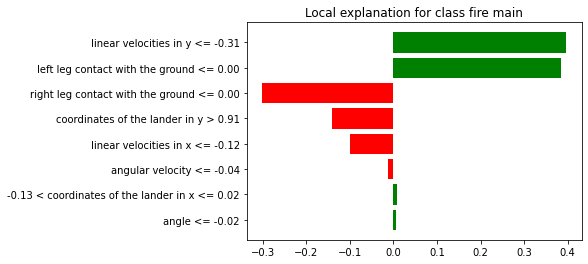

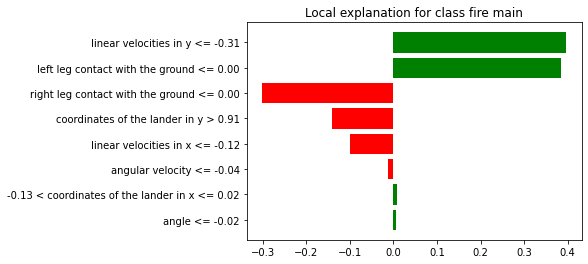

In [13]:
data = train[11]
print(data)
exp = explainer.explain_instance(data, get_proba, labels=(2,))
exp.show_in_notebook(show_table=True)
exp.as_pyplot_figure(label=2)

[-0.0654602   1.3210443  -0.38308775 -0.3269615  -0.11889166 -0.34796032
  0.          0.        ]


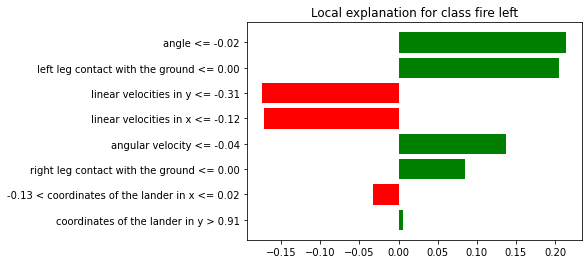

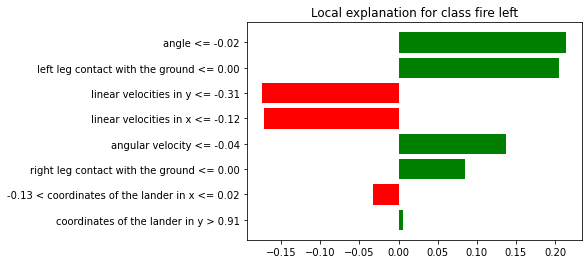

In [14]:
data = train[14]
print(data)
exp = explainer.explain_instance(data, get_proba, labels=(1,))
exp.show_in_notebook(show_table=True)
exp.as_pyplot_figure(label=1)

[-0.15782289  0.87778974  0.06267936 -0.26005104 -0.01428124  0.13922602
  0.          0.        ]


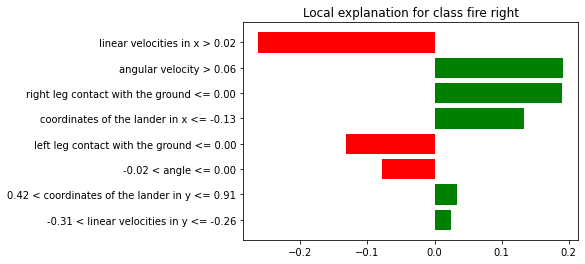

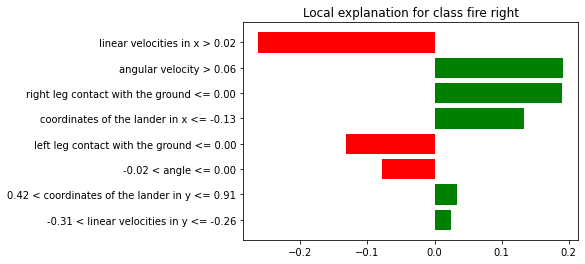

In [15]:
data = train[73]
print(data)
exp = explainer.explain_instance(data, get_proba, labels=(3,))
exp.show_in_notebook(show_table=True)
exp.as_pyplot_figure(label=3)

[-0.13166952 -0.01203757  0.00549039 -0.09815862 -0.05416489 -0.40159464
  1.          1.        ]


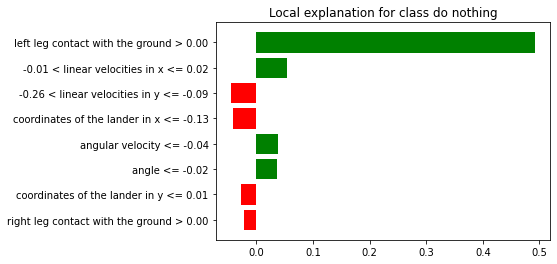

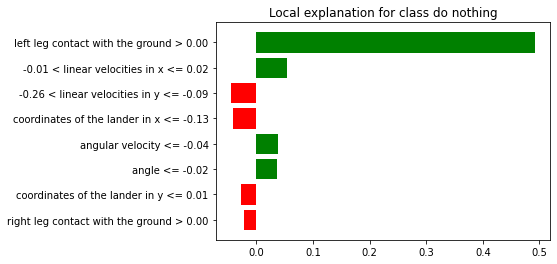

In [16]:
data = train[232]
print(data)
exp = explainer.explain_instance(data, get_proba, labels=(0,))
exp.show_in_notebook(show_table=True)
exp.as_pyplot_figure(label=0)

[ 5.7939053e-02 -4.4520140e-04 -7.7673940e-02 -1.8198760e-01
  2.7462862e-02 -3.3198154e-01  0.0000000e+00  1.0000000e+00]


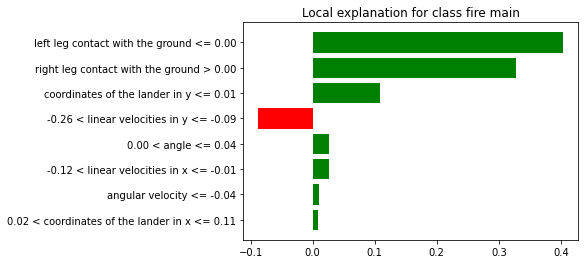

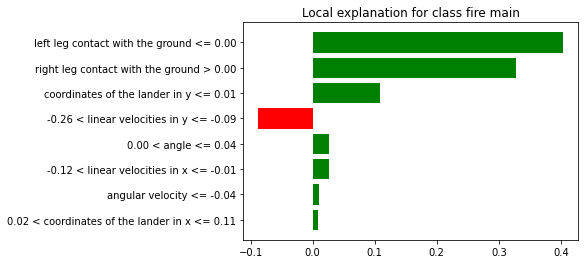

In [17]:
data = train[535]
print(data)
exp = explainer.explain_instance(data, get_proba, labels=(2,))
exp.show_in_notebook(show_table=True)
exp.as_pyplot_figure(label=2)

[ 0.03263826 -0.00325351 -0.2076365  -0.17941064 -0.00434686  0.42182738
  1.          0.        ]


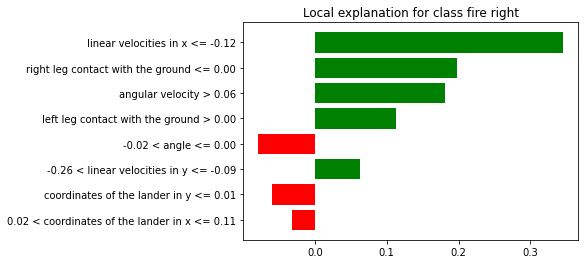

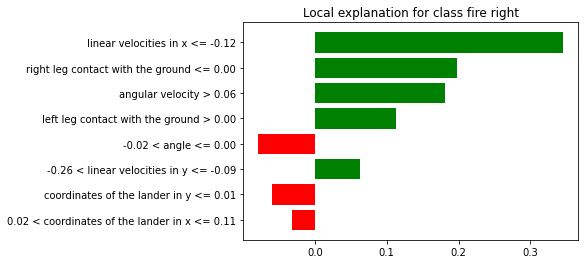

In [18]:
data = train[1117]
print(data)
exp = explainer.explain_instance(data, get_proba, labels=(3,))
exp.show_in_notebook(show_table=True)
exp.as_pyplot_figure(label=3)

[-1.4688320e-01  2.8303624e-04  4.9078020e-03 -1.3750000e-01
  1.4513698e-02 -7.0516455e-01  0.0000000e+00  1.0000000e+00]


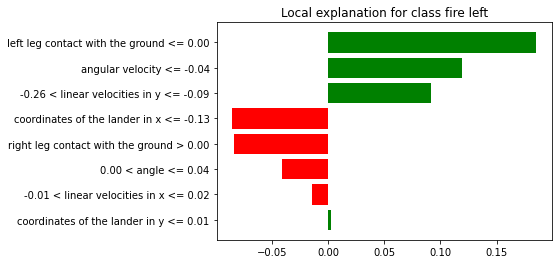

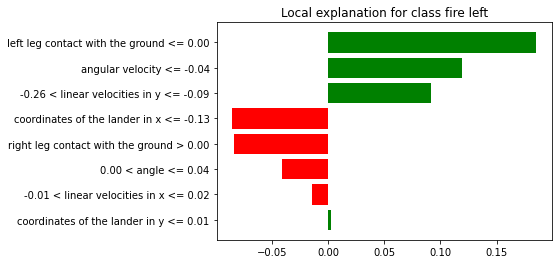

In [19]:
data = train[1730]
print(data)
exp = explainer.explain_instance(data, get_proba, labels=(1,))
exp.show_in_notebook(show_table=True)
exp.as_pyplot_figure(label=1)